I wanted to compare the gradient term of robust training and nonrobust training.
So I have fixed epsilon to 0.2 in the doublebackTrainer and compute the loss term in every training.

# Plotting level sets

The goal is to plot the level set evolution for the neural ODEs with standard and robust training

In [1]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

import matplotlib.pyplot as plt
import numpy as np



# Juptyer magic: For export. Makes the plots size right for the screen 
%matplotlib inline
# %config InlineBackend.figure_format = 'retina'

%config InlineBackend.figure_formats = ['svg'] 


torch.backends.cudnn.deterministic = True
torch.manual_seed(2)
torch.cuda.manual_seed(2)

g = torch.Generator()
g.manual_seed(1)


# Data preparation

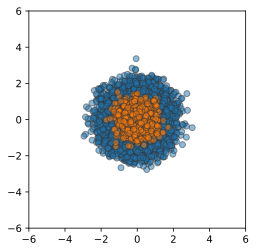

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons, make_circles, make_blobs
from sklearn.preprocessing import StandardScaler

from torch.utils import data as data
from torch.utils.data import DataLoader, TensorDataset

def create_dataloader(data_type, batch_size = 3000, noise = 0.15, factor = 0.15, random_state = 1, shuffle = False, plotlim = [-2, 2]):
    if data_type == 'circles':
        X, y = make_circles(batch_size, noise=noise, factor=factor, random_state=random_state, shuffle = shuffle)
        
        
    elif data_type == 'blobs':
        centers = [[-1, -1], [1, 1]]
        X, y = make_blobs(
    n_samples=batch_size, centers=centers, cluster_std=noise, random_state=0)
        
        
    elif data_type == 'moons':
        X, y = make_moons(batch_size, noise = noise, shuffle = shuffle , random_state = 0)
    
    
    elif data_type == 'xor':
        X = torch.randint(low=0, high=2, size=(batch_size, 2), dtype=torch.float32)
        y = np.logical_xor(X[:, 0] > 0, X[:, 1] > 0).float()
        # y = y.to(torch.int64)
        X += noise * torch.randn(X.shape)
        
        
    else: 
        print('datatype not supported')
        return None, None

    g = torch.Generator()
    g.manual_seed(random_state)
    
    X = StandardScaler().fit_transform(X)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.05 ) #random_state=2, shuffle = shuffle)

    X_train = torch.Tensor(X_train) # transform to torch tensor for dataloader
    y_train = torch.Tensor(y_train) #transform to torch tensor for dataloader

    X_test = torch.Tensor(X_test) # transform to torch tensor for dataloader
    y_test = torch.Tensor(y_test) #transform to torch tensor for dataloader

    X_train = X_train.type(torch.float32)  #type of orginial pickle.load data
    y_train = y_train.type(torch.int64) #dtype of original picle.load data

    X_test = X_test.type(torch.float32)  #type of orginial pickle.load data
    y_test = y_test.type(torch.int64) #dtype of original picle.load data


    train_data = TensorDataset(X_train,y_train) # create your datset
    test_data = TensorDataset(X_test, y_test)

    train = DataLoader(train_data, batch_size=64, shuffle=shuffle, generator=g)
    test = DataLoader(test_data, batch_size=256, shuffle=shuffle, generator = g) #128 before
    
    data_0 = X_train[y_train == 0]
    data_1 = X_train[y_train == 1]
    fig = plt.figure()
    plt.scatter(data_0[:, 0], data_0[:, 1], edgecolor="#333",  alpha = 0.5) #color = 'crimson',
    plt.scatter(data_1[:, 0], data_1[:, 1], edgecolor="#333", alpha = 0.5) #color = 'dodgerblue'
    plt.xlim(plotlim)
    plt.ylim(plotlim)
    ax = plt.gca()
    ax.set_aspect('equal')
    plt.savefig('trainingset.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
    plt.show()
    
    return train, test


data_noise = 0.25
plotlim = [-6, 6]
dataloader, dataloader_viz = create_dataloader('circles', noise = data_noise, plotlim = plotlim)



#Visualizing the data


In [3]:
#We can now conveniently access the data from the dataloaders
for X_test, y_test in dataloader_viz:
    print(X_test[:10], y_test[:10])
    break
    

tensor([[ 0.1069,  0.7324],
        [ 1.3595,  1.8092],
        [-0.5898, -0.4996],
        [-1.3536,  1.0815],
        [-0.3959, -0.3147],
        [-0.6176, -0.9097],
        [ 0.3424,  0.3816],
        [-0.4087,  1.2420],
        [ 0.6251, -1.9988],
        [-0.4438,  0.3307]]) tensor([1, 0, 1, 0, 1, 0, 1, 1, 0, 1])


# Model dynamics

In [4]:
#Import of the model dynamics that describe the neural ODE
#The dynamics are based on the torchdiffeq package, that implements ODE solvers in the pytorch setting
from models.neural_odes import NeuralODE

#for neural ODE based networks the network width is constant. In this example the input is 2 dimensional
hidden_dim, data_dim = 2, 2 
augment_dim = 0

#T is the end time of the neural ODE evolution, num_steps are the amount of discretization steps for the ODE solver
T, num_steps = 20, 20 
bound = 0.
fp = False #this recent change made things not work anymore
cross_entropy = True
turnpike = False


non_linearity = 'tanh' #'relu' #
architecture = 'inside' #outside



torch.manual_seed(2)
torch.cuda.manual_seed(2)
anode = NeuralODE(device, data_dim, hidden_dim, augment_dim=augment_dim, non_linearity=non_linearity, 
                    architecture=architecture, T=T, time_steps=num_steps, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_anode = torch.optim.Adam(anode.parameters(), lr=1e-3) 


print(anode)

    


NeuralODE(
  (flow): Semiflow(
    (dynamics): Dynamics(
      (non_linearity): Tanh()
      (fc2_time): Sequential(
        (0): Linear(in_features=2, out_features=2, bias=True)
        (1): Linear(in_features=2, out_features=2, bias=True)
        (2): Linear(in_features=2, out_features=2, bias=True)
        (3): Linear(in_features=2, out_features=2, bias=True)
        (4): Linear(in_features=2, out_features=2, bias=True)
        (5): Linear(in_features=2, out_features=2, bias=True)
        (6): Linear(in_features=2, out_features=2, bias=True)
        (7): Linear(in_features=2, out_features=2, bias=True)
        (8): Linear(in_features=2, out_features=2, bias=True)
        (9): Linear(in_features=2, out_features=2, bias=True)
        (10): Linear(in_features=2, out_features=2, bias=True)
        (11): Linear(in_features=2, out_features=2, bias=True)
        (12): Linear(in_features=2, out_features=2, bias=True)
        (13): Linear(in_features=2, out_features=2, bias=True)
        (14

In [5]:
torch.manual_seed(2)
torch.cuda.manual_seed(2)
rnode = NeuralODE(device, data_dim, hidden_dim, augment_dim=0, non_linearity=non_linearity, 
                    architecture=architecture, T=T, time_steps=num_steps, fixed_projector=fp, cross_entropy=cross_entropy)
optimizer_rnode = torch.optim.Adam(rnode.parameters(), lr=1e-3) 


print(rnode)

NeuralODE(
  (flow): Semiflow(
    (dynamics): Dynamics(
      (non_linearity): Tanh()
      (fc2_time): Sequential(
        (0): Linear(in_features=2, out_features=2, bias=True)
        (1): Linear(in_features=2, out_features=2, bias=True)
        (2): Linear(in_features=2, out_features=2, bias=True)
        (3): Linear(in_features=2, out_features=2, bias=True)
        (4): Linear(in_features=2, out_features=2, bias=True)
        (5): Linear(in_features=2, out_features=2, bias=True)
        (6): Linear(in_features=2, out_features=2, bias=True)
        (7): Linear(in_features=2, out_features=2, bias=True)
        (8): Linear(in_features=2, out_features=2, bias=True)
        (9): Linear(in_features=2, out_features=2, bias=True)
        (10): Linear(in_features=2, out_features=2, bias=True)
        (11): Linear(in_features=2, out_features=2, bias=True)
        (12): Linear(in_features=2, out_features=2, bias=True)
        (13): Linear(in_features=2, out_features=2, bias=True)
        (14

# Training

In [6]:
from models.training import Trainer, doublebackTrainer

num_epochs = 100 #number of optimization runs in which the dataset is used for gradient decent
rob_eps = 0.2 #Set robust training parameter in order to compare standard training to robuts training (and logging the gradient term in both cases)


trainer_anode = doublebackTrainer(anode, optimizer_anode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, verbose = True, eps = 0, eps_comp = rob_eps) 

trainer_anode.train(dataloader, num_epochs)


Iteration 0/45
Loss: 1.108
Robust Term Loss: 0.000
Accuracy: 0.422

Iteration 10/45
Loss: 0.843
Robust Term Loss: 0.000
Accuracy: 0.469

Iteration 20/45
Loss: 0.756
Robust Term Loss: 0.000
Accuracy: 0.453

Iteration 30/45
Loss: 0.728
Robust Term Loss: 0.000
Accuracy: 0.500

Iteration 40/45
Loss: 0.722
Robust Term Loss: 0.000
Accuracy: 0.531
Epoch 1: 0.817

Iteration 0/45
Loss: 0.773
Robust Term Loss: 0.000
Accuracy: 0.438

Iteration 10/45
Loss: 0.723
Robust Term Loss: 0.000
Accuracy: 0.500

Iteration 20/45
Loss: 0.682
Robust Term Loss: 0.000
Accuracy: 0.547

Iteration 30/45
Loss: 0.687
Robust Term Loss: 0.000
Accuracy: 0.531

Iteration 40/45
Loss: 0.671
Robust Term Loss: 0.000
Accuracy: 0.562
Epoch 2: 0.714

Iteration 0/45
Loss: 0.714
Robust Term Loss: 0.000
Accuracy: 0.453

Iteration 10/45
Loss: 0.673
Robust Term Loss: 0.000
Accuracy: 0.516

Iteration 20/45
Loss: 0.646
Robust Term Loss: 0.000
Accuracy: 0.547

Iteration 30/45
Loss: 0.664
Robust Term Loss: 0.000
Accuracy: 0.531

Iterat

In [7]:
   
w = anode.linear_layer.weight
b = anode.linear_layer.bias

print(w)
print(b)

rnode.linear_layer.weight = w
rnode.linear_layer.bias = b

rnode.linear_layer.requires_grad =  False

Parameter containing:
tensor([[ 1.1531,  1.1480],
        [-1.2502, -0.3030]], requires_grad=True)
Parameter containing:
tensor([ 0.1383, -0.1789], requires_grad=True)


In [8]:
from models.training import doublebackTrainer

# num_epochs = 120 #number of optimization runs in which the dataset is used for gradient decent
trainer_rnode = doublebackTrainer(rnode, optimizer_rnode, device, cross_entropy=cross_entropy, turnpike = turnpike,
                         bound=bound, fixed_projector=fp, verbose = True, eps = rob_eps) 

trainer_rnode.train(dataloader, num_epochs)


Iteration 0/45
Loss: 0.944
Robust Term Loss: 0.000
Accuracy: 0.344

Iteration 10/45
Loss: 0.648
Robust Term Loss: 0.000
Accuracy: 0.578

Iteration 20/45
Loss: 0.621
Robust Term Loss: 0.000
Accuracy: 0.703

Iteration 30/45
Loss: 0.732
Robust Term Loss: 0.000
Accuracy: 0.703

Iteration 40/45
Loss: 0.438
Robust Term Loss: 0.000
Accuracy: 0.766
Epoch 1: 0.702

Iteration 0/45
Loss: 0.524
Robust Term Loss: 0.000
Accuracy: 0.766

Iteration 10/45
Loss: 0.450
Robust Term Loss: 0.000
Accuracy: 0.781

Iteration 20/45
Loss: 0.464
Robust Term Loss: 0.000
Accuracy: 0.766

Iteration 30/45
Loss: 0.547
Robust Term Loss: 0.000
Accuracy: 0.781

Iteration 40/45
Loss: 0.376
Robust Term Loss: 0.000
Accuracy: 0.812
Epoch 2: 0.491

Iteration 0/45
Loss: 0.469
Robust Term Loss: 0.000
Accuracy: 0.766

Iteration 10/45
Loss: 0.419
Robust Term Loss: 0.000
Accuracy: 0.797

Iteration 20/45
Loss: 0.387
Robust Term Loss: 0.000
Accuracy: 0.859

Iteration 30/45
Loss: 0.496
Robust Term Loss: 0.000
Accuracy: 0.828

Iterat

In [9]:
   
w = anode.linear_layer.weight
b = anode.linear_layer.bias

print(w)
print(b)

wr = rnode.linear_layer.weight
br = rnode.linear_layer.bias

print(wr)
print(br)

Parameter containing:
tensor([[ 1.1531,  1.1480],
        [-1.2502, -0.3030]], requires_grad=True)
Parameter containing:
tensor([ 0.1383, -0.1789], requires_grad=True)
Parameter containing:
tensor([[ 1.1531,  1.1480],
        [-1.2502, -0.3030]], requires_grad=True)
Parameter containing:
tensor([ 0.1383, -0.1789], requires_grad=True)


# Plotting Level Sets

Observe that the blue and red data points are getting seperated further as time passes.

In [10]:
import seaborn as sns
from matplotlib.colors import to_rgba, to_rgb
import numpy as np
import torch.nn as nn

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
# from plots.plots import classification_levelsets

In [11]:
@torch.no_grad()
def classification_levelsets(model, fig_name=None, footnote=None, contour = True, plotlim = [-2, 2], layer = -1):
    x1lower, x1upper = plotlim
    x2lower, x2upper = plotlim

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    fig = plt.figure(figsize=(5, 5), dpi=100)

    plt.ylabel(r"$x_2$")
    plt.xlabel(r"$x_1$")
    plt.figtext(0.5, 0, footnote, ha="center", fontsize=10)



    model.to(device)

    x1 = torch.arange(x1lower, x1upper, step=0.01, device=device)
    x2 = torch.arange(x2lower, x2upper, step=0.01, device=device)
    xx1, xx2 = torch.meshgrid(x1, x2)  # Meshgrid function as in numpy
    model_inputs = torch.stack([xx1, xx2], dim=-1)

    if layer == -1:
        preds, _ = model(model_inputs)

    else: 
        _, proj_traj = model(model_inputs)
        preds = proj_traj[layer,:,:]


    # dim = 2 means that it normalizes along the last dimension, i.e. along the two predictions that are the model output
    m = nn.Softmax(dim=2)
    # softmax normalizes the model predictions to probabilities
    preds = m(preds)

    #we only need the probability for being in class1 (as prob for class2 is then 1- class1)
    preds = preds[:, :, 0]
    preds = preds.unsqueeze(2)  # adds a tensor dimension at position 2

    plt.grid(False)
    plt.xlim([x1lower, x1upper])
    plt.ylim([x2lower, x2upper])

    ax = plt.gca()
    ax.set_aspect('equal') 

    if contour:
        colors = [to_rgb("C1"), [1, 1, 1], to_rgb("C0")] # first color is orange, last is blue
        cm = LinearSegmentedColormap.from_list(
            "Custom", colors, N=40)
        z = np.array(preds).reshape(xx1.shape)
        
        levels = np.linspace(0.,1.,8).tolist()
        
        cont = plt.contourf(xx1, xx2, z, levels, alpha=1, cmap=cm, zorder = 0, extent=(x1lower, x1upper, x2lower, x2upper)) #plt.get_cmap('coolwarm')
        cbar = fig.colorbar(cont, fraction=0.046, pad=0.04)
        cbar.ax.set_ylabel('prediction prob.')


    if fig_name:
        plt.savefig(fig_name + '.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
        plt.clf()
        plt.close()
    else: plt.show()

In [12]:
def comparison_plot(fig1, title1, fig2, title2, output_file, fig_size = 10, show = False):
    plt.figure(dpi = 300, figsize=(fig_size, fig_size))
    plt.subplot(121)
    sub1 = imageio.imread(fig1)
    plt.imshow(sub1)
    plt.title(title1)
    plt.axis('off')

    plt.subplot(122)
    sub2 = imageio.imread(fig2)
    plt.imshow(sub2)
    plt.title(title2)
    plt.axis('off')
    plt.savefig(output_file, bbox_inches='tight', dpi=600, format='png', facecolor = 'white')
    if show: plt.show()
    else:
        plt.gca()
        plt.close()

In [13]:
import imageio
import os
fig_name_base = 'levelsets'
fig_name = fig_name_base + '.png'
gif_name = fig_name_base + '_comp.gif'

fig_name_base_rob = fig_name_base + '_rob'
fig_name_rob = fig_name_base_rob + '.png'



imgs = []
for layer in range(num_steps):
    classification_levelsets(anode, fig_name = fig_name_base, layer = layer, plotlim = plotlim, footnote = f'{layer = }')
    # imgs.append(imageio.imread(fig_name))
    classification_levelsets(rnode, fig_name = fig_name_base_rob, layer = layer, plotlim = plotlim, footnote = f'{layer = }')
    
    comparison_plot(fig_name, 'standard training', fig_name_rob, 'robust training', 'levelsets_comp.png')
    print(layer, ' plotted')
    
    # plt.figure(dpi = 600)
    # plt.subplot(121)
    # levelsets = imageio.imread(fig_name)
    # plt.imshow(levelsets)
    # plt.title('Standard Training')
    # plt.axis('off')

    # plt.subplot(122)
    # levelsets_rob = imageio.imread(fig_name_rob)
    # plt.imshow(levelsets_rob)
    # plt.title('Robust Training')
    # plt.axis('off')
    # plt.savefig('levelsets_comp.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
    # plt.clf()
    # plt.close()
    
    imgs.append(imageio.imread('levelsets_comp.png'))
    # if not (num_steps == layer + 1): os.remove(fig_name_rob) #keep last image
imageio.mimwrite(gif_name, imgs, fps = 1)
# visualize_classification(rnode, X_viz, y_viz, fig_name = 'class_test1')


c:\ProgramData\Anaconda3\lib\site-packages\torch\functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


0  plotted
1  plotted
2  plotted
3  plotted
4  plotted
5  plotted
6  plotted
7  plotted
8  plotted
9  plotted
10  plotted
11  plotted
12  plotted
13  plotted
14  plotted
15  plotted
16  plotted
17  plotted
18  plotted
19  plotted


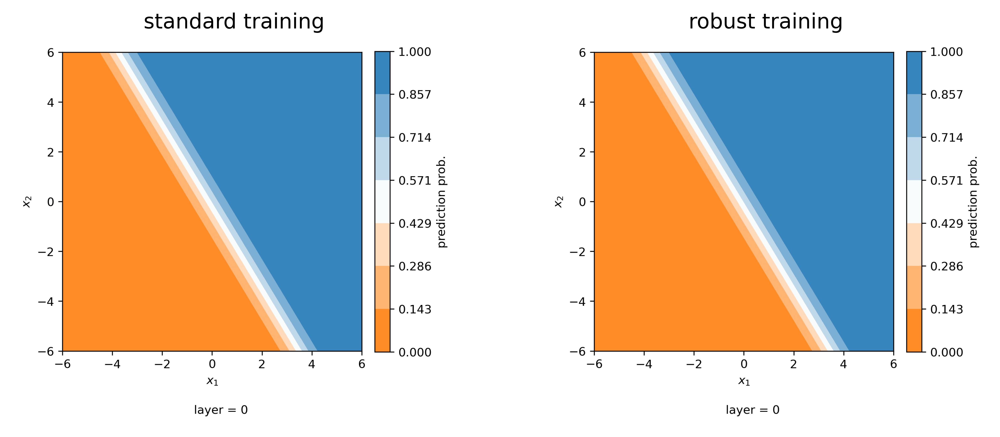

In [14]:
from IPython.display import Image
Image(filename="levelsets_comp.gif",  width = 800)

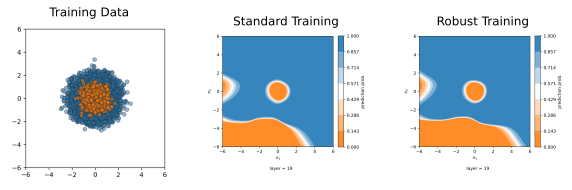

In [15]:
import imageio

plt.figure(dpi = 600, figsize = (10,30))

plt.subplot(131)
levelsets_rob = imageio.imread('trainingset.png')
plt.imshow(levelsets_rob)
plt.title('Training Data')
plt.axis('off')

plt.subplot(132)
levelsets = imageio.imread('levelsets.png')
plt.imshow(levelsets)
plt.title('Standard Training')
plt.axis('off')

plt.subplot(133)
levelsets_rob = imageio.imread('levelsets_rob.png')
plt.imshow(levelsets_rob)
plt.title('Robust Training')
plt.axis('off')

plt.savefig('levelset_comp.png', bbox_inches='tight', dpi=600, format='png', facecolor = 'white')
plt.show()

## Loss

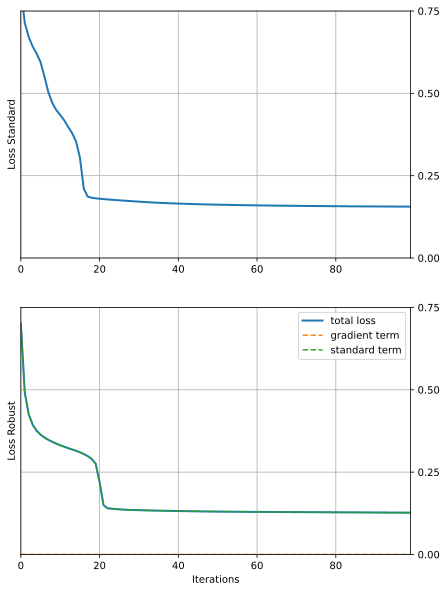

In [16]:
plt.figure(dpi = 300, figsize = (7,10))
labelsize = 10

plt.subplot(211)
plt.plot(trainer_anode.histories['epoch_loss_history'], linewidth = 2)
# plt.plot(trainer_anode.histories['epoch_loss_rob_history'], zorder = -1, linewidth = 1)
plt.xlim(0, len(trainer_anode.histories['epoch_loss_history']) - 1)
plt.ylim([0,0.75])

plt.yticks(np.arange(0,1,0.25))
plt.grid()
ax = plt.gca()
ax.yaxis.tick_right()
# ax.set_aspect()
plt.ylabel('Loss Standard', size = labelsize)

plt.subplot(212)
plt.plot(trainer_rnode.histories['epoch_loss_history'], linewidth = 2)
plt.plot(trainer_rnode.histories['epoch_loss_rob_history'], '--', zorder = -1)
plt.plot([loss - rob for loss, rob in zip(trainer_rnode.histories['epoch_loss_history'],trainer_rnode.histories['epoch_loss_rob_history'])],'--')
plt.xlim(0, len(trainer_rnode.histories['epoch_loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations', size = labelsize)
plt.ylabel('Loss Robust', size = labelsize)
plt.legend(['total loss', 'gradient term', 'standard term'], prop= {'size': labelsize})
plt.yticks(np.arange(0,1,0.25))
ax = plt.gca()
ax.yaxis.tick_right()
plt.grid()

plt.savefig('loss_comp.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
plt.show()
# plt.clf()
# plt.close()




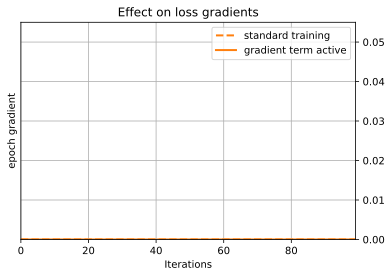

In [17]:
plt.plot(trainer_anode.histories['epoch_loss_rob_history'],'--', linewidth = 2, color = 'C1')
plt.title('Effect on loss gradients')
plt.plot(trainer_rnode.histories['epoch_loss_rob_history'], zorder = -1, linewidth = 2, color = 'C1')
plt.xlim(0, len(trainer_rnode.histories['epoch_loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations', size = labelsize)
plt.ylabel('epoch gradient', size = labelsize)
plt.legend(['standard training', 'gradient term active'], prop= {'size': labelsize})
# plt.yticks(np.arange(0,1.25,0.25))
ax = plt.gca()
ax.yaxis.tick_right()
plt.grid()

plt.savefig('loss_comp_grads.png', bbox_inches='tight', dpi=300, format='png', facecolor = 'white')
plt.show()


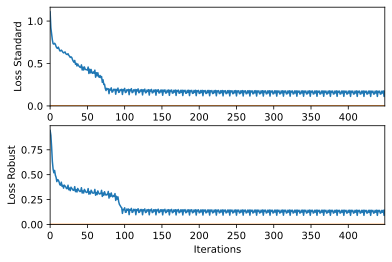

In [18]:
plt.figure(dpi = 300)
plt.subplot(211)
plt.plot(trainer_anode.histories['loss_history'])
plt.plot(trainer_anode.histories['loss_rob_history'], zorder = -1)
plt.xlim(0, len(trainer_anode.histories['loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations')
plt.ylabel('Loss Standard')

plt.subplot(212)
plt.plot(trainer_rnode.histories['loss_history'])
plt.plot(trainer_rnode.histories['loss_rob_history'], zorder = -1)
# plt.plot([loss - rob for loss, rob in zip(trainer_rnode.histories['epoch_loss_history'],trainer_rnode.histories['epoch_loss_rob_history'])])
plt.xlim(0, len(trainer_rnode.histories['loss_history']) - 1)
plt.ylim(0)
plt.xlabel('Iterations')
plt.ylabel('Loss Robust')
plt.savefig('loss_comp.png', bbox_inches='tight', dpi=600, format='png', facecolor = 'white')
plt.show()

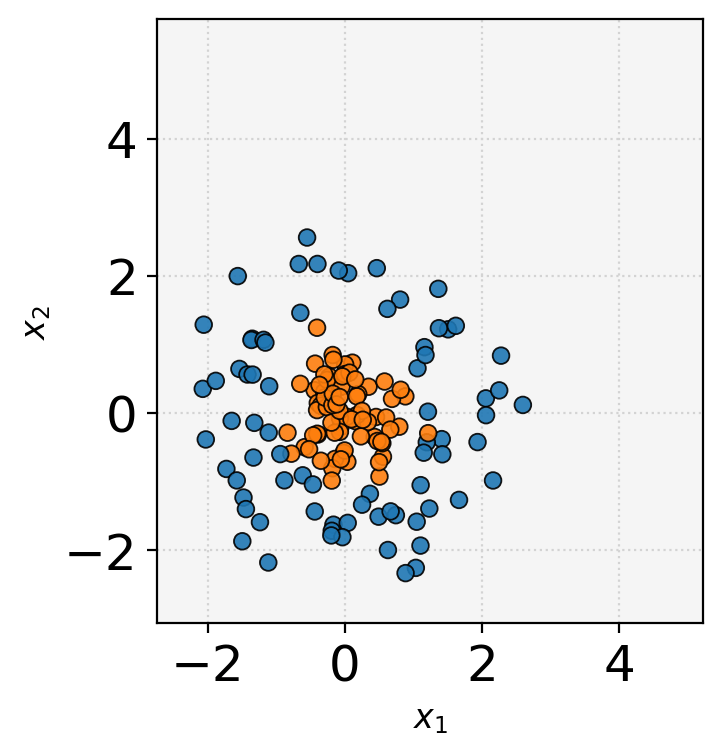

In [19]:
from plots.gifs import trajectory_gif

#the function trajectory_gif creates the evolution trajectories of the input data through the network
#the passing time corresponds to the depth of the network

for X_viz, y_viz in dataloader_viz:
    trajectory_gif(anode, X_viz, y_viz, timesteps=num_steps, filename = 'trajectory.gif')
    break

#Display of the generated gif

from IPython.display import Image
Image(filename="trajectory.gif", retina = True)

In [20]:
from plots.gifs import trajectory_gif

#the function trajectory_gif creates the evolution trajectories of the input data through the network
#the passing time corresponds to the depth of the network

for X_viz, y_viz in dataloader_viz:
    trajectory_gif(rnode, X_viz, y_viz, timesteps=num_steps, filename = 'trajectory_db.gif')
    break

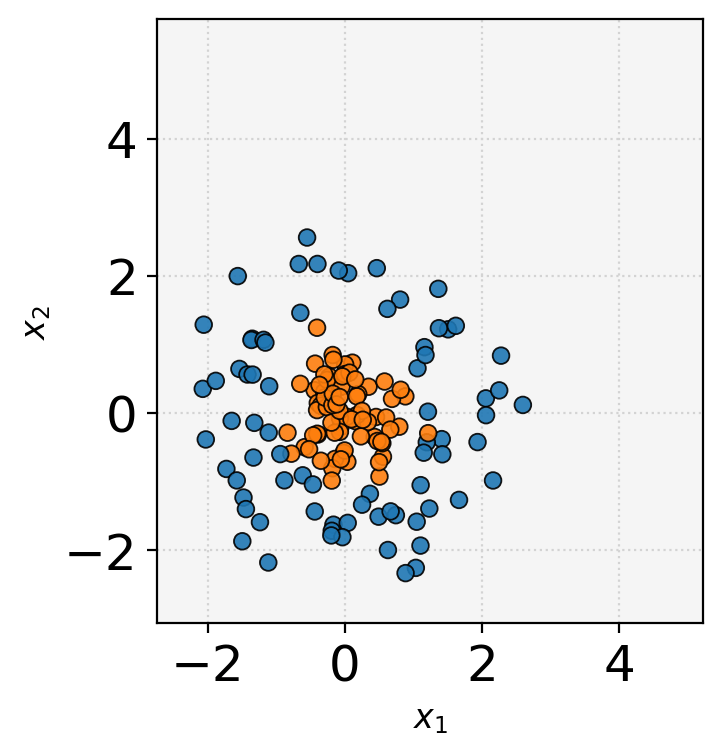

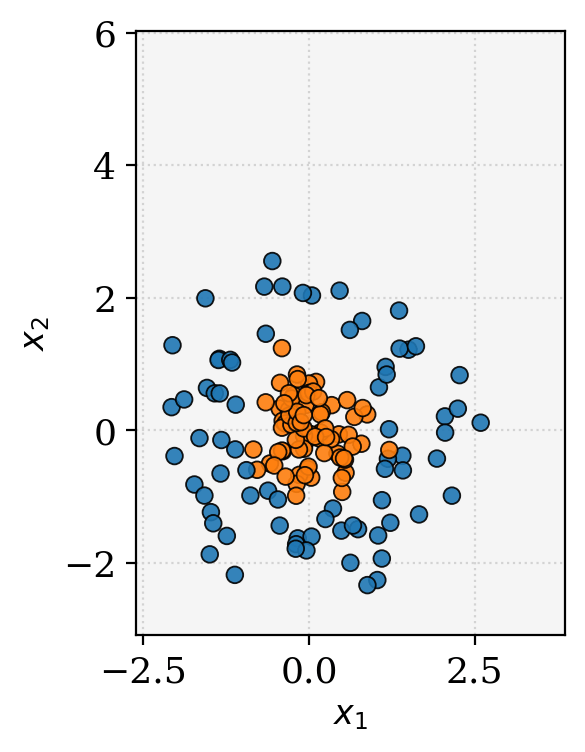

In [21]:
#Display of the generated gif

from IPython.display import Image
traj = Image(filename="trajectory.gif", retina = True)
rtraj = Image(filename="trajectory_db.gif", retina = True)
display(traj, rtraj)


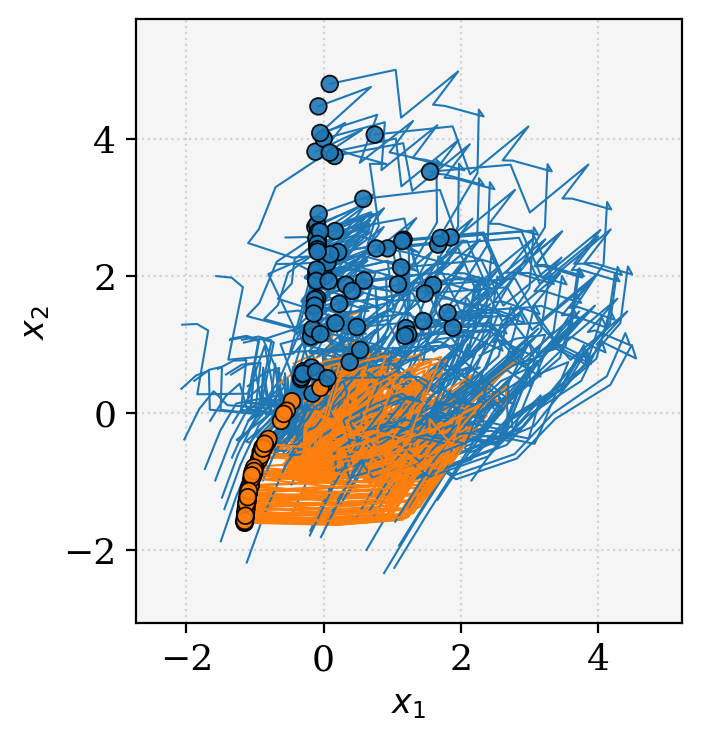

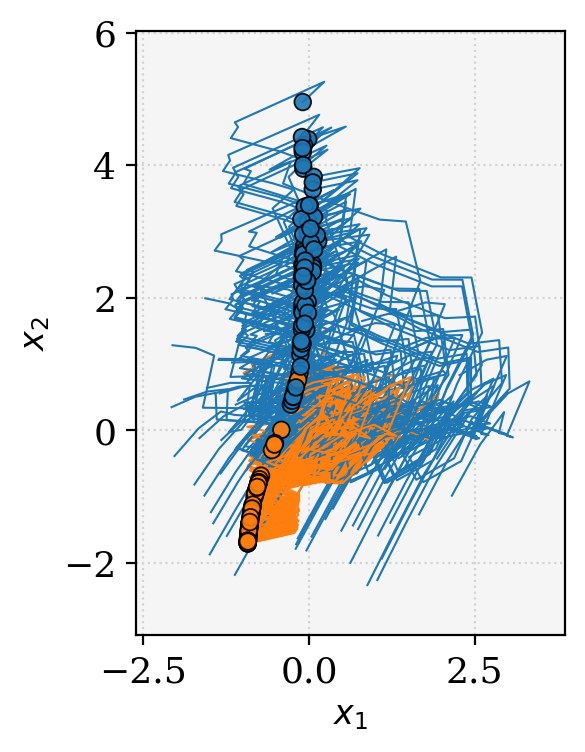

In [22]:
from IPython.display import Image
traj = Image(filename="trajectory19.png", retina = True)
rtraj = Image(filename="trajectory_db19.png", retina = True)
display(traj, rtraj)

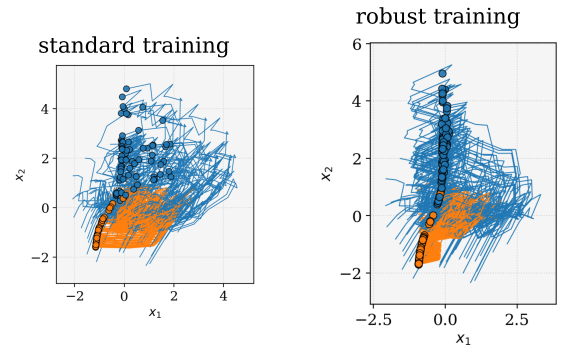

In [23]:
comparison_plot('trajectory19.png', 'standard training', 'trajectory_db19.png', 'robust training', 'traj_comp.png', show = True)
